# Проект: Детекция объектов. 


In [1]:
# Буду работать с игральными картами

import glob
import shutil
from pathlib import Path
from xml.etree import ElementTree as ET

import albumentations as A
import matplotlib.pyplot as plt
import numpy as np
import torch
import torchvision
import ultralytics
from albumentations.pytorch.transforms import ToTensorV2
from matplotlib.patches import Rectangle
from PIL import Image
from torch import nn
from torchvision.models import ResNet50_Weights
from tqdm.auto import tqdm
import os
import cv2

# !unzip -q data.zip

In [2]:
# Проверка доступа GPU
if torch.cuda.is_available():
    print("GPU доступен")
    print(f"Текущее устройство: {torch.cuda.current_device()}")
    print(f"Имя устройства: {torch.cuda.get_device_name(torch.cuda.current_device())}")
else:
    print("GPU недоступен")

GPU доступен
Текущее устройство: 0
Имя устройства: NVIDIA GeForce RTX 4060 Laptop GPU


In [3]:
# Переносим модель на GPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [4]:
def get_xml_data(image_name, root, class_dict, xml_prefix="\\xmls\\"):
    # get smth like ZZZ/YYY/XXXXXX.jpg -> XXXXXX
    filename = image_name.split("\\")[-1].split(".")[0]
    # read xml
    tree = ET.parse(str(root) + xml_prefix + filename + ".xml")
    treeroot = tree.getroot()
    # iterate over bboxes
    bboxes = []
    for member in treeroot.findall("object"):
        class_name = member.find("name").text
        class_id = class_dict[class_name]

        bndbox = member.find("bndbox")
        xmin = int(bndbox.find("xmin").text)
        ymin = int(bndbox.find("ymin").text)
        xmax = int(bndbox.find("xmax").text)
        ymax = int(bndbox.find("ymax").text)
        res = [xmin, ymin, xmax, ymax, class_id]

        bboxes.append(res)

    return bboxes

Пользовалась видео https://www.youtube.com/watch?v=oCwEmKW3bYg

In [ ]:
class PascalDataset(torch.utils.data.Dataset):
    def __init__(self, *, transform, root="dataset", train=True, seed=42):
        self.root = Path(root)
        self.transform = transform

        assert self.root.is_dir(), f"No data at `{root}`"

        self.filenames = np.array(glob.glob(root + "\\images\\*"))
        with open(str(self.root) + "\\class_dict", "r") as f:
            self.class_dict = eval(f.readline())

        self.class_dict_inv = {v: k for k, v in self.class_dict.items()}

        np.random.seed(seed)
        permutation = np.random.permutation(len(self.filenames))

        # Train/test split
        if train:
            self.filenames = self.filenames[
                permutation[: int(len(self.filenames) * 0.9)]
            ].tolist()
        else:
            self.filenames = self.filenames[
                permutation[int(len(self.filenames) * 0.9) :]
            ].tolist()

    def __getitem__(self, idx):
        fname = self.filenames[idx]
        image = np.array(Image.open(fname).convert("RGB"))
        bboxes = get_xml_data(fname, self.root, self.class_dict)
        
       
        return self.transform(image=image, bboxes=bboxes)

    def __get_raw_item__(self, idx):
        fname = self.filenames[idx]
        return fname, get_xml_data(fname, self.root, self.class_dict)

    def __len__(self):
        return len(self.filenames)

Ниже определяем стандартные нормализации и приведение размера к 512x512.


In [6]:
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

train_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=mean, std=std),
        ToTensorV2(),
    ],
    # Вот тут мы говорим что хотим pascal_voc
    bbox_params=dict(format="pascal_voc", min_visibility=0.3),
)

test_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.augmentations.transforms.Normalize(mean=mean, std=std),
        ToTensorV2(),
    ],
    bbox_params=dict(format="pascal_voc", min_visibility=0.5),
)

In [7]:
train_ds = PascalDataset(root=".\\data", transform=train_transform, train=True)
test_ds = PascalDataset(root=".\\data", transform=test_transform, train=False)

In [8]:
 # Посмотрим, есть ли данные
print(len(train_ds))
print(len(test_ds))

print(train_ds.filenames[:5])
print(test_ds.filenames[:5])

326
37
['.\\data\\images\\IMG_2496.JPG', '.\\data\\images\\cam_image4.jpg', '.\\data\\images\\cam_image23.jpg', '.\\data\\images\\IMG_2647.JPG', '.\\data\\images\\IMG_2388.JPG']
['.\\data\\images\\IMG_2580.JPG', '.\\data\\images\\IMG_2385.JPG', '.\\data\\images\\cam_image8.jpg', '.\\data\\images\\IMG_2507.JPG', '.\\data\\images\\IMG_2522.JPG']


In [9]:
# Проверка, что пути записаны правильно тк была замена / на \\
img = Image.open(".\\data\\images\\IMG_2496.JPG")
print(img.size)

(378, 504)


Теперь, когда мы загрузили данные, хорошо бы посмотреть на них, прежде чем обучать какие-либо модели. 

Тут пользовалась пунктом 6 ( Визуализация дополнений) отсюда https://albumentations.ai/docs/3-basic-usage/image-classification/#6-visualize-augmentations-crucial-debugging-step

In [10]:
def visualize(images, bboxes):
    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)

    _, axes = plt.subplots(
        2, 
        len(images) // 2 + len(images) % 2, 
        figsize=(10, 8), dpi=100
    )

    for i, ax in enumerate(axes.reshape(-1)):

        ax.axis(False)

        if i >= len(images):
            break

        image = images[i]

        if isinstance(image, torch.Tensor):
            image = image.cpu().numpy()

        if image.shape[0] == 3:
            image = np.transpose(image, (1, 2, 0))

        image = image * std + mean
        image = np.clip(image, 0, 1)

        ax.imshow(image)

        for bbox in bboxes[i]:
            x1, y1, x2, y2, cls_id = bbox
            label = train_ds.class_dict_inv[cls_id]

            rect = Rectangle(
                (x1, y1),         
                x2 - x1,           
                y2 - y1,          
                linewidth=2,
                edgecolor="g",
                facecolor="none"
            )
            ax.add_patch(rect)

            # Добавляем текст над прямоугольником
            ax.text(
                x1,
                y1,
                label,
                color="white",
                fontsize=10,
                bbox=dict(facecolor="green", alpha=0.5, pad=0.3)
            )

    plt.tight_layout()
    plt.show()

У вас должно получиться что-то похожее на изображения для датасета с масками:

![image](https://i.imgur.com/V5TUT26.png)

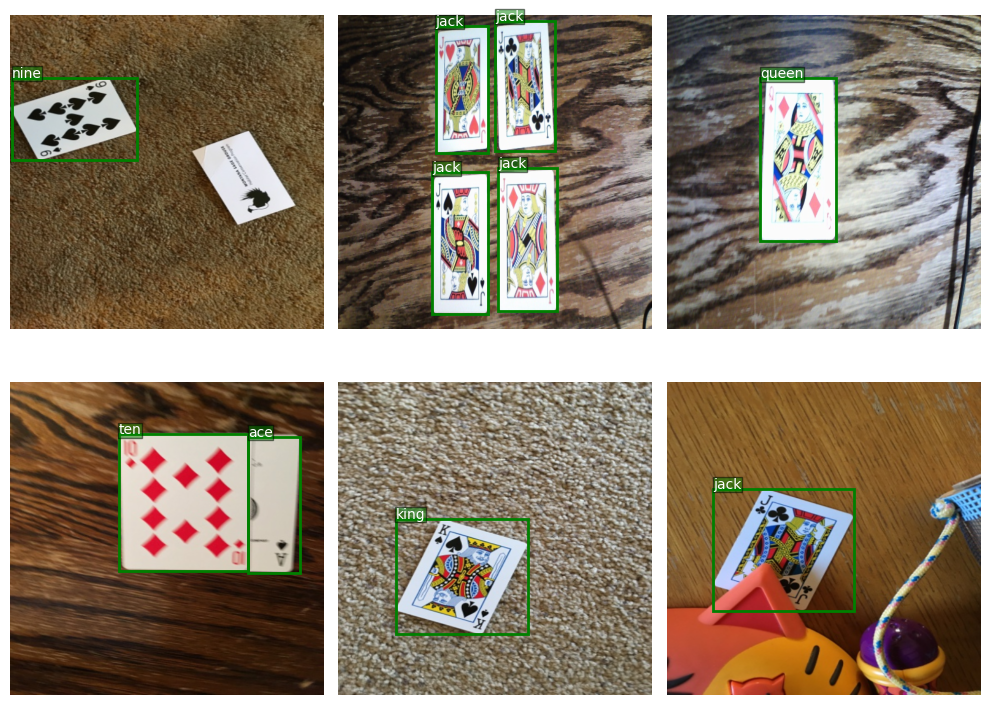

In [11]:
out = [train_ds[i] for i in range(6)]
visualize([o["image"] for o in out], [o["bboxes"] for o in out])

## Задача 3.1. 
Первым делом нам нужно реализовать collate function. Это функция позволит нам кастомизировать, как именно батч конструируется из примеров (смотрите [pytorch docs](https://pytorch.org/docs/stable/data.html#dataloader-collate-fn) для деталей).

Это функция должна принять на вход лист прямоугольников и вернуть тензор размера Bx6x16x16. Первая размерность - это количество примеров в батче. Вторая -- "каналы", суть которых написана чуть ниже. Далее идут две пространственные размерности, это сетка 16 на 16. Зафиксируем порядок координат как (y, x) для этой сетки 16 на 16. Это значит, что в target идут ```cy_idx, cx_idx``` в таком порядке, см. код. 

В шести "каналах" у нас будут записаны:
* Сдвиги центра bbox относительно начала клеточки (клеточка это "гиперпиксель" на изображении 16 на 16 на выходе сети). Записаны эти сдвиги будут в клеточку, к которой относятся. 2 канала (X, Y)
* Нормализованные ширина и высота bbox. 2 канала (W, H)
* Confidence сетки. Им мы будем пользоваться, чтобы фильтровать уверенность сетки в наличии bbox в данной клетке. Таргет содержит 1 там, где bbox есть, и 0 иначе. 1 канал
* Класс детекции (тот самый int, полученный из строки с названием)

### Пояснительная картинка.

Она обладает некоторым уровнем абстракции, чёрных например должно быть 512, а зелёная должна захватывать 32 маленькие черные. Но может будет понятнее :)

![image](https://i.imgur.com/13YVxAd.jpeg)

In [ ]:
def collate_fn(batch, downsample=32):
    imgs, batch_boxes = map(list, (zip(*[(b["image"], b["bboxes"]) for b in batch])))

    imgs = torch.stack(imgs)
    b, _, h, w = imgs.shape

    target = imgs.new_zeros(b, 6, h // downsample, w // downsample)

    # Add sample index to targets
    for i, boxes in enumerate(batch_boxes):
        xmin, ymin, xmax, ymax, classes = map(
            torch.squeeze, torch.split(imgs.new_tensor(boxes), 1, dim=-1)
        )
        x_cell = w / (w // downsample)
        y_cell = h / (h // downsample)
        
        w_box = (xmax - xmin) / w
        h_box = (ymax - ymin) / h

        cx = (xmin + xmax) / 2
        cy = (ymin + ymax) / 2
        cx_idx = torch.floor(cx / x_cell).long()
        cy_idx = torch.floor(cy / y_cell).long()

        cx_box =  (cx - x_cell * cx_idx) / x_cell
        cy_box = (cy - y_cell * cy_idx) / y_cell

        # cy_idx, потом cx_idx
        target[i, :, cy_idx, cx_idx] = torch.stack(
            [cx_box, cy_box, w_box, h_box, torch.ones_like(cx_box), classes]
        )

    return {"image": imgs, "target": target}

Проверка

In [13]:
def test_collate_fn() -> None:
    target1 = [100, 200, 200, 300, 2]  # xmin, ymin, xmax, ymax, class
    target2_1 = [0, 250, 200, 300, 0]  # xmin, ymin, xmax, ymax, class
    target2_2 = [0, 100, 100, 300, 1]  # xmin, ymin, xmax, ymax, class

    result = collate_fn(
        [
            {"image": torch.rand((3, 512, 512)), "bboxes": [target1]},
            {"image": torch.rand((3, 512, 512)), "bboxes": [target2_1, target2_2]},
        ]
    )

    # Проверяем размерности
    assert result["image"].shape == (2, 3, 512, 512)
    assert result["target"].shape == (2, 6, 16, 16)

    # Проверяем значения клеточек, в которые попали ббоксы
    assert np.allclose(
        result["target"][0, :, 7, 4],
        torch.tensor([22 / 32, 26 / 32, 100 / 512, 100 / 512, 1, 2]),
    )
    assert np.allclose(
        result["target"][1, :, 8, 3],
        torch.tensor([4 / 32, 19 / 32, 200 / 512, 50 / 512, 1, 0]),
    )
    assert np.allclose(
        result["target"][1, :, 6, 1],
        torch.tensor([18 / 32, 8 / 32, 100 / 512, 200 / 512, 1, 1]),
    )

    # Проверяем, что все остальные клеточки содержат нули
    result["target"][0, :, 7, 4] = result["target"][1, :, 8, 3] = result["target"][
        1, :, 6, 1
    ] = torch.zeros(6)
    assert np.allclose(result["target"], 0)


test_collate_fn()

решетка размера 16 на 16 на исходном изображении:

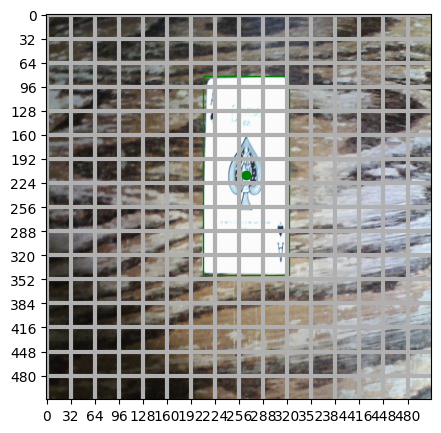

In [14]:
fig, ax = plt.subplots(figsize=(5, 5))
i = 20

img = train_ds[i]["image"].permute(1, 2, 0) * torch.tensor(std).view(
    1, 1, -1
) + torch.tensor(mean).view(1, 1, -1)
bboxes = torch.tensor(train_ds[i]["bboxes"])

ax.imshow(img)
loc = plt.matplotlib.ticker.MultipleLocator(base=32)
ax.xaxis.set_major_locator(loc)
ax.yaxis.set_major_locator(loc)
ax.grid(which="major", axis="both", linestyle="-", linewidth=3)

for bbox in bboxes:
    xmin, ymin, xmax, ymax = bbox[:-1]
    w = xmax - xmin
    h = ymax - ymin
    with_mask = bbox[-1]
    ax.add_patch(Rectangle((xmin, ymin), w, h, fill=False, color="green"))

cx = (bboxes[:, 0] + bboxes[:, 2]) / 2
cy = (bboxes[:, 1] + bboxes[:, 3]) / 2

ax.scatter(cx, cy, color="green", marker="o")

plt.show()

## Задача 3.2

Выход моей нейросети будет немного шире, чем B×6×16×16, потому что задача предполагает несколько классов — и для каждого из них сеть выдаёт отдельный канал с вероятностями.

Я реализую функцию decode_prediction, которая будет выполнять обратное преобразование по отношению к collate_fn:

если на вход пришёл тензор с 6 каналами, значит, это target — и я просто извлеку значения классов, уже записанные в ячейках;
если каналов больше 6, значит, это выход нейросети — и я применю argmax по измерению классов, чтобы определить наиболее вероятный класс для каждого объекта.
В результате в обоих случаях я получу корректный набор прямоугольников с координатами, размерами и правильными метками классов.

In [15]:
from typing import List
def decode_prediction(pred, upsample=32, threshold=0.7) -> List[List[List[float]]]:
    b, c, h, w = pred.shape
    img_w, img_h = w * upsample, h * upsample
    result = []
    for i in range(b):
        image_boxes = []
        conf_map = pred[i, 4]  
        if c > 6:
            class_probs, classes = torch.max(pred[i, 5:], dim=0)
            mask = conf_map * class_probs > threshold
        else:
            classes = pred[i, 5].long()
            mask = conf_map > threshold

        cy_idx, cx_idx = torch.where(mask)

        for j in range(len(cx_idx)):
            cx = cx_idx[j]
            cy = cy_idx[j]

            dx = pred[i, 0, cy, cx]
            dy = pred[i, 1, cy, cx]

            dw = pred[i, 2, cy, cx]
            dh = pred[i, 3, cy, cx]

            conf = pred[i, 4, cy, cx]

            if c > 6:
                cls = classes[cy, cx]
                score = conf * class_probs[cy, cx]
            else:
                cls = int(pred[i, 5, cy, cx].item())
                score = conf

            if score < threshold:
                continue

            center_x = (cx + dx) * upsample
            center_y = (cy + dy) * upsample

            width = dw * img_w
            height = dh * img_h

            xmin = (center_x - width / 2)
            ymin = (center_y - height / 2)
            xmax = (center_x + width / 2)
            ymax = (center_y + height / 2)

            image_boxes.append([xmin.item(), ymin.item(), xmax.item(), ymax.item(), cls.item()])

        result.append(image_boxes)
    return result

Следующей функцией проверяем свою реализацию

In [16]:
def test_decode_predictions() -> None:
    # Применяем collate_fn к некоторым данным
    target1 = [[100, 200, 200, 300, 2]]
    target2 = [[0, 250, 200, 300, 0], [0, 100, 100, 300, 1]]
    result = collate_fn(
        [
            {"image": torch.rand((3, 512, 512)), "bboxes": target1},
            {"image": torch.rand((3, 512, 512)), "bboxes": target2},
        ]
    )

    target = result["target"]
    assert target.shape == (2, 6, 16, 16)
    # В таком виде target соответствует поиску одного класса - 6-ой канал.
    # Добавим еще 2 канала, чтобы проверить работу функции для нескольких классов
    target = torch.cat(
        [target, torch.zeros(2, 2, 16, 16)], dim=1
    )  # Добавляем два канала
    assert target.shape == (2, 8, 16, 16)  # Теперь их стало 8

    target[0, 5:, 7, 4] = torch.tensor([0.5, 0.6, 0.9])  # Это должен быть класс 2
    target[1, 5:, 8, 3] = torch.tensor([0.9, 0.6, 0.5])  # Это должен быть класс 0
    target[1, 5:, 6, 1] = torch.tensor([0.6, 0.9, 0.5])  # Это должен быть класс 1

    # Считаем результат
    actual = decode_prediction(target)
    print("Actual:  ", actual)

    # Порядок ббоксов для target2 может меняться в зависимости от вашей реализации и это не ошибка.
    # Скорее всего, он будет такой. Но если ассерт не проходит, попробуйте поменять их местами.
    expected = [target1, [target2[1], target2[0]]]
    # expected = [ target1, [ target2[0], target2[1] ] ] # <-- такой ответ тоже правильный.
    print("Expected:", expected)

    # Сравниваем
    assert actual == expected


test_decode_predictions()

Actual:   [[[100.0, 200.0, 200.0, 300.0, 2]], [[0.0, 100.0, 100.0, 300.0, 1], [0.0, 250.0, 200.0, 300.0, 0]]]
Expected: [[[100, 200, 200, 300, 2]], [[0, 100, 100, 300, 1], [0, 250, 200, 300, 0]]]


## Задача 3.3.
Я реализую модель на основе ResNet50: возьму первые 4 блока (до layer4 включительно, например, через list(model.children())[:-2]), а затем добавлю собственный головной блок.

В этом блоке я последовательно уменьшу количество каналов — например, от 2048 до 512 → 128 → 32 → 5 + C, где C — число классов в моём датасете, — и одновременно сожму пространственное разрешение до 16×16. Использовать буду свёртки с ядром 3×3 и padding=1, но при необходимости попробую и другие размеры фильтров для точного контроля размера выхода.

Последним слоем обязательно будет свёртка, после которой применю сигмоиду, чтобы привести все предсказания (координаты, размеры и классы) к диапазону [0, 1], как того требует постановка задачи.

In [17]:
train_ds.class_dict

{'king': 0, 'jack': 1, 'ace': 2, 'ten': 3, 'nine': 4, 'queen': 5}

In [18]:
C = len(train_ds.class_dict)

class Detector(nn.Module):
    def __init__(self):
        super().__init__()
        model = torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT)
        encoder_layers = list(model.children())[:-2]  
        self.resnet50 = nn.Sequential(*encoder_layers)

        self.feature_reduction = nn.Sequential(
            # 2048 -> 512
            nn.Conv2d(2048, 512, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(512),
            nn.ReLU(),

            # 512 -> 128
            nn.Conv2d(512, 128, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(128),
            nn.ReLU(),

            # 128 -> 32
            nn.Conv2d(128, 32, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(32),
            nn.ReLU(),

            # 32 -> 5 + C
            nn.Conv2d(32, 5 + C, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(5 + C)  
        )
        self.output_adjustment = nn.Conv2d(5 + C, 5 + C, kernel_size=3, padding=1, bias=False)
        self.activation = nn.Sigmoid()

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        features = self.resnet50(x)     
        processed = self.feature_reduction(features)    
        output = self.output_adjustment(processed)
        return self.activation(output)

## Задача 3.4
Я реализую функцию потерь, аналогичную оригинальной из YOLOv1, состоящую из четырёх компонент с reduction='sum':

* localization loss — MSE между предсказанными и истинными координатами центра бокса только в ячейках, где есть объект;
* box_loss — MSE между корнями ширины и высоты (чтобы усилить штраф за ошибку на маленьких боксах), тоже только по ячейкам с объектами;
* classification_loss — кросс-энтропия по классу, вычисляемая только там, где обнаружен объект;
* confidence_loss — бинарная кросс-энтропия (через BCELoss) для всех ячеек: с весом 1 — где объект есть, и с уменьшенным весом (например, 0.1) — где объекта нет (для балансировки, так как фоновых ячеек гораздо больше).

Для корректного выделения ячеек с объектами я создам маску и воспользуюсь masked_select из PyTorch. При этом учту параметр C (число классов), чтобы правильно индексировать каналы предсказаний и таргетов.

In [19]:
def special_loss(pred, target, C=C):
    mse = nn.MSELoss(reduction='sum')
    cross_entropy = nn.CrossEntropyLoss(reduction='sum')
    bce = nn.BCELoss(reduction='none')

    obj_mask = target[:, 4] > 0
    no_obj_mask = ~obj_mask

    pred_cx = pred[:, 0][obj_mask]
    target_cx = target[:, 0][obj_mask]
    pred_cy = pred[:, 1][obj_mask]
    target_cy = target[:, 1][obj_mask]
    localization_loss = mse(pred_cx, target_cx) + mse(pred_cy, target_cy)

    pred_w = torch.sqrt(pred[:, 2][obj_mask])
    target_w = torch.sqrt(target[:, 2][obj_mask])
    pred_h = torch.sqrt(pred[:, 3][obj_mask])
    target_h = torch.sqrt(target[:, 3][obj_mask])
    box_loss = mse(pred_w, target_w) + mse(pred_h, target_h)

    pred_cls = pred[:, 5:5+C].permute(0, 2, 3, 1)[obj_mask]
    target_cls = target[:, 5][obj_mask].long()
    classification_loss = cross_entropy(pred_cls, target_cls)

    pred_conf = pred[:, 4]
    target_conf = target[:, 4]
    conf_loss_obj = (bce(pred_conf[obj_mask], target_conf[obj_mask])).sum()
    conf_loss_no_obj = 0.1 * (bce(pred_conf[no_obj_mask], target_conf[no_obj_mask])).sum()
    confidence_loss = conf_loss_obj + conf_loss_no_obj

    return localization_loss + box_loss + classification_loss + confidence_loss
     

# Задача 4. 

Обучение модели

In [20]:
loader = torch.utils.data.DataLoader(train_ds, 10, collate_fn=collate_fn)

In [21]:
# Это уже было написано в самом начале, но продублирую еще раз тут
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


torch.manual_seed(21)
EPOCHS =  15
model = Detector().to(device)
opt = torch.optim.AdamW(model.parameters(), lr=1e-3)

for e in tqdm(range(EPOCHS)):
    pbar = tqdm(loader, leave=False)
    epoch_losses = []
    for batch in pbar:
        images = batch["image"].to(device)
        target = batch["target"].to(device)

        pred = model(images)
        loss = special_loss(pred, target, C=len(train_ds.class_dict))

        opt.zero_grad()
        loss.backward()
        opt.step()

        epoch_losses.append(loss.item())
        pbar.set_description(f"Loss: {loss.item():.3f}")

    print(f"Epoch {e} done; Train loss {np.mean(epoch_losses):.3f};")

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 0 done; Train loss 164.567;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 1 done; Train loss 108.679;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 2 done; Train loss 73.177;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 3 done; Train loss 54.197;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 4 done; Train loss 47.133;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 5 done; Train loss 41.553;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 6 done; Train loss 35.095;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 7 done; Train loss 32.013;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 8 done; Train loss 31.039;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 9 done; Train loss 28.850;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 10 done; Train loss 26.823;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 11 done; Train loss 25.866;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 12 done; Train loss 25.577;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 13 done; Train loss 25.389;


  0%|          | 0/33 [00:00<?, ?it/s]

Epoch 14 done; Train loss 25.297;


Запустим обученный детектор на тестовых изображениях:

In [22]:
test_loader = torch.utils.data.DataLoader(test_ds, 6, collate_fn=collate_fn)
i = iter(test_loader)
batch = next(i)

In [23]:
# Нужно сделать предсказание и переложить результат на cpu
model.eval()
with torch.no_grad():
    images = batch["image"].to(device)
    pred = model(images)

In [24]:
decoded_boxes = decode_prediction(pred, upsample=32, threshold=0.5)

# Переносим на CPU для визуализации
images = images.cpu()
decoded_boxes = [[box for box in img_boxes] for img_boxes in decoded_boxes]
class_dict_inv = train_ds.class_dict_inv

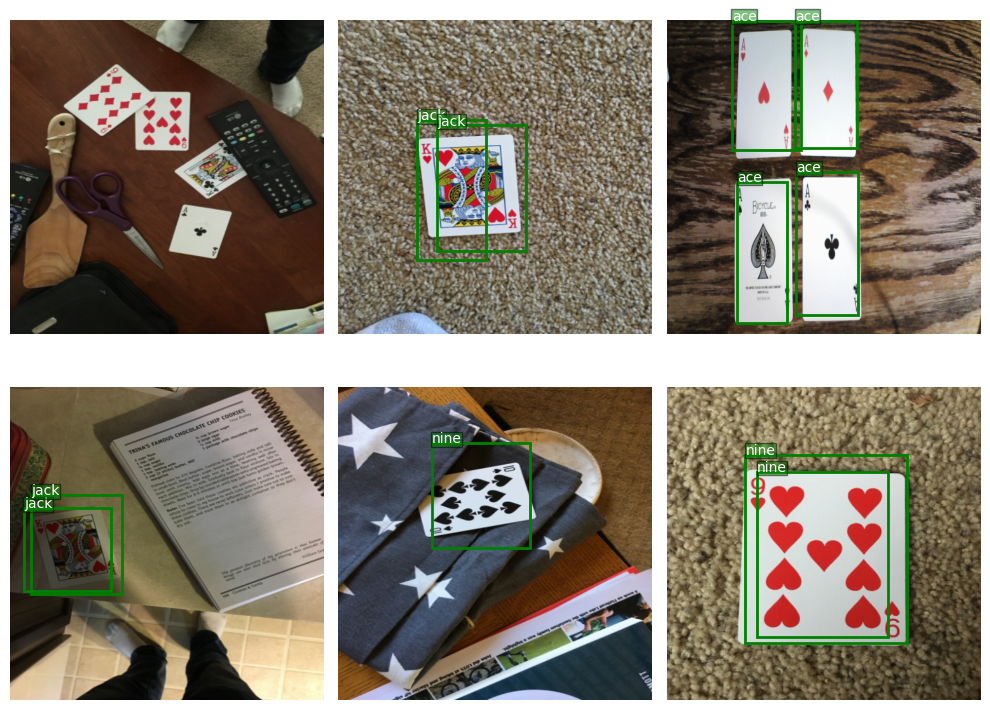

In [ ]:
# Визуализация
visualize(batch['image'], decoded_boxes)

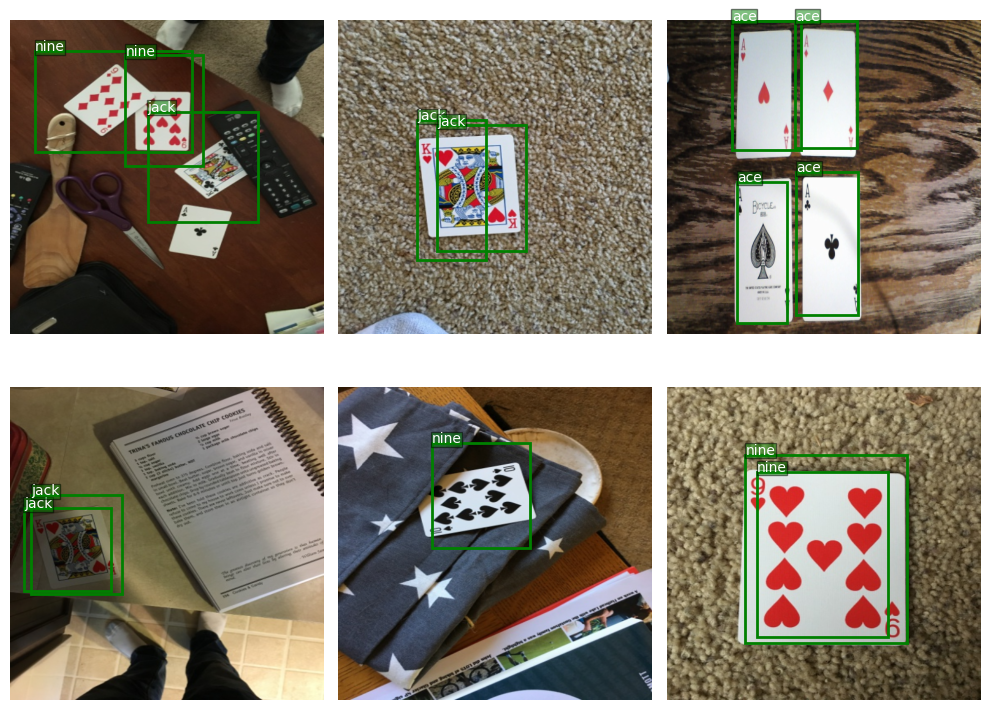

In [26]:
visualize(batch['image'], decode_prediction(pred, upsample=32, threshold=0.2))

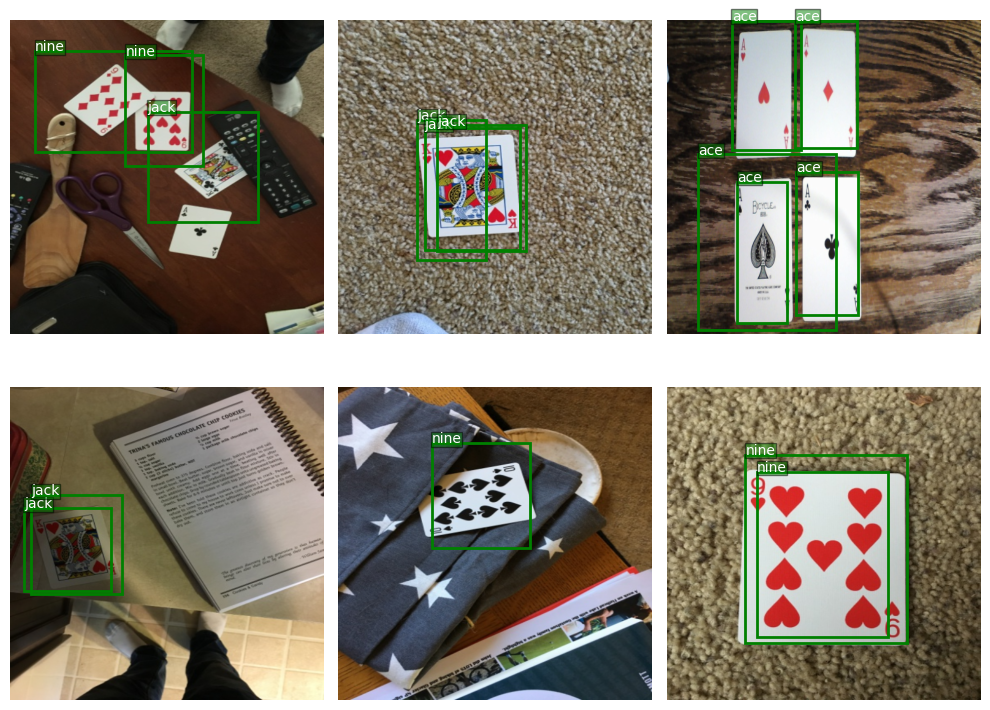

In [27]:
visualize(batch['image'], decode_prediction(pred, upsample=32, threshold=0.15))

# Задача 4 

## Прикручиваем NMS

In [28]:
# Вспомогательная функция, которая вычисляет IoU между box1 и каждым из boxes2
def calc_iou(box1, boxes2):
    x1, y1, x2, y2 = box1
    areas = (boxes2[:, 2] - boxes2[:, 0]) * (boxes2[:, 3] - boxes2[:, 1])
    inter_x1 = torch.max(x1, boxes2[:, 0])
    inter_y1 = torch.max(y1, boxes2[:, 1])
    inter_x2 = torch.min(x2, boxes2[:, 2])
    inter_y2 = torch.min(y2, boxes2[:, 3])

    inter_area = torch.clamp(inter_x2 - inter_x1, min=0) * torch.clamp(inter_y2 - inter_y1, min=0)
    area1 = (x2 - x1) * (y2 - y1)
    area2 = areas

    iou = inter_area / (area1 + area2 - inter_area)
    return iou

In [29]:
def NMS(bboxes, threshold):
    if not bboxes:
        return []
    
    bboxes = torch.tensor(bboxes)
    boxes = bboxes[:, :4]
    scores = bboxes[:, 4]
    keep = []

    indices = torch.argsort(scores, descending=True)

    while indices.numel() > 0:
        best_idx = indices[0]
        keep.append(best_idx.item())

        best_box = boxes[best_idx]
        other_boxes = boxes[indices[1:]]
        ious = calc_iou(best_box, other_boxes)

        remaining_indices = indices[1:][ious < threshold]
        indices = remaining_indices

    return bboxes[keep].tolist()

In [30]:
def decode_prediction_nms(pred, upsample=32, threshold=0.7):
    B, _, H, W = pred.shape
    img_w, img_h = W * upsample, H * upsample
    result = []

    for i in range(B):
        image_boxes = []

        cx = pred[i, 0].clone()
        cy = pred[i, 1].clone()
        w = pred[i, 2].clone()
        h = pred[i, 3].clone()
        conf = pred[i, 4].clone()
        _, cls_ids = torch.max(pred[i, 5:], dim=0)

        mask = conf > threshold
        coords = torch.stack([cx, cy, w, h], dim=0)[:, mask]
        confs = conf[mask]
        classes = cls_ids[mask]

        if coords.shape[1] == 0:
            result.append([])
            continue

        cell_coords = torch.stack(torch.where(mask), dim=0).float()
        grid_size = upsample

        abs_cx = (coords[0] + cell_coords[1]) * grid_size
        abs_cy = (coords[1] + cell_coords[0]) * grid_size
        abs_w = coords[2] * img_w
        abs_h = coords[3] * img_h

        xmin = (abs_cx - abs_w / 2).clamp(0, img_w)
        ymin = (abs_cy - abs_h / 2).clamp(0, img_h)
        xmax = (abs_cx + abs_w / 2).clamp(0, img_w)
        ymax = (abs_cy + abs_h / 2).clamp(0, img_h)

        for j in range(len(xmin)):
            box = [
                xmin[j].item(),
                ymin[j].item(),
                xmax[j].item(),
                ymax[j].item(),
                confs[j].item(),
                classes[j].item()
            ]
            image_boxes.append(box)

        image_boxes = NMS(image_boxes, threshold=0.5)
        image_boxes = [[b[0], b[1], b[2], b[3], b[5]] for b in image_boxes]
        result.append(image_boxes)

    return result

In [31]:
decoded_boxes_nms = decode_prediction_nms(pred)

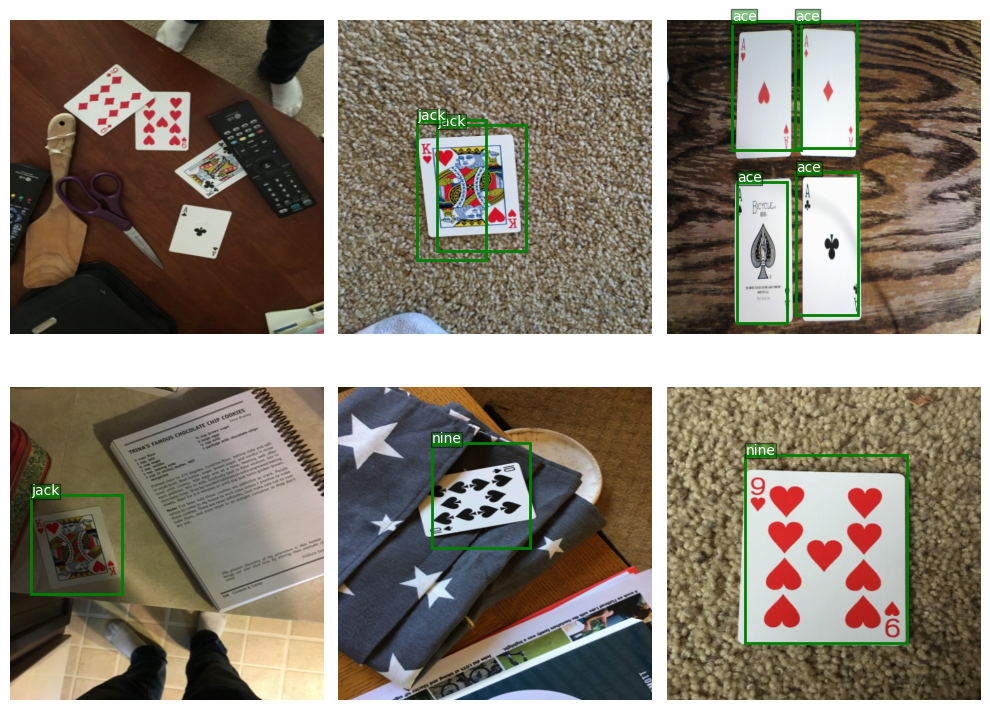

In [32]:
visualize(batch['image'], decoded_boxes_nms)

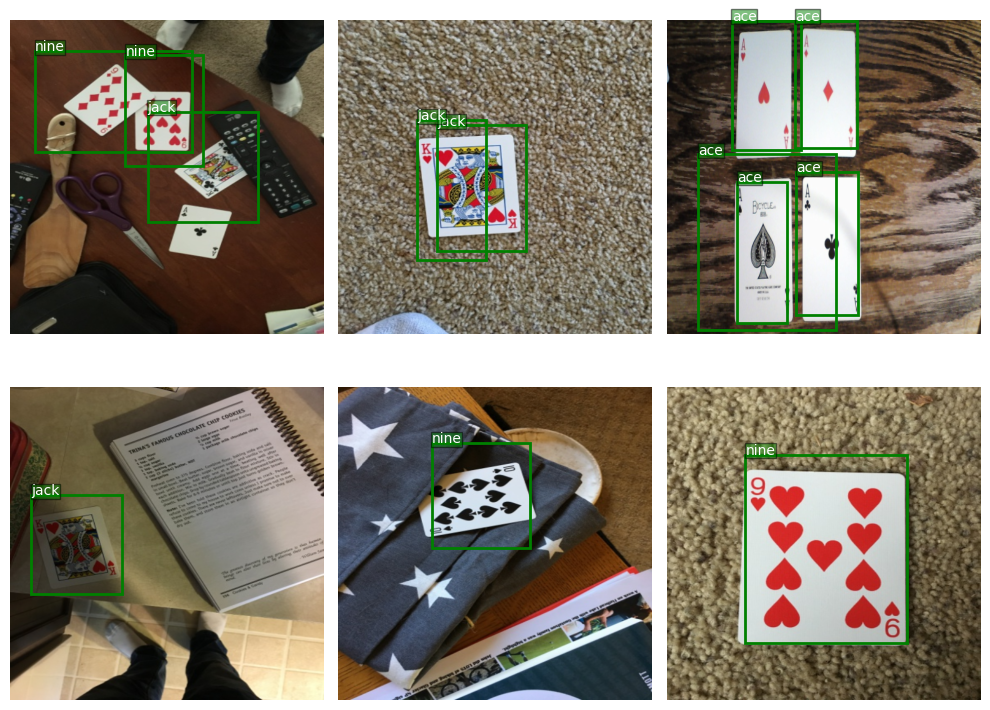

In [33]:
visualize(batch['image'], decode_prediction_nms(pred, threshold=0.15))

Стало немного лучше

# Задача 5.

Займёмся более простыми вещами. Возьмем готовую архитектуру, обучим её на наших данных и посмотрим.

Для этого будем использовать YOLO 11 от ultralytics.

In [57]:
# !pip install ultralytics

## Задача 5.1. 

Чтобы дальше модель обучалась одной строкой, данные нужно переложить в правильный формат

In [ ]:
# # Делаем папочки
# !rm -rf train
# !rm -rf valid
# !mkdir -p train/images train/labels valid/images valid/labels

https://docs.ultralytics.com/ru/datasets/detect/?spm=a2ty_o01.29997173.0.0.2abe517173X3IA#ultralytics-yolo-format

In [34]:
def annotation2txt(bboxes, w_im, h_im):
    result = []
    for box in bboxes:
        xmin, ymin, xmax, ymax, cls_id = box

        cx = (xmin + xmax) / 2
        cy = (ymin + ymax) / 2

        w = xmax - xmin
        h = ymax - ymin

        cx_norm = cx / w_im
        cy_norm = cy / h_im
        w_norm = w / w_im
        h_norm = h / h_im

        result.append(f"{int(cls_id)} {cx_norm:.5f} {cy_norm:.5f} {w_norm:.5f} {h_norm:.5f}")

    return result

In [35]:
# Посмотрим, что папки созданы
os.makedirs(".\\train\\images", exist_ok=True)
os.makedirs(".\\train\\labels", exist_ok=True)
os.makedirs(".\\valid\\images", exist_ok=True)
os.makedirs(".\\valid\\labels", exist_ok=True)

In [ ]:
# Копируем картиночки по папочкам и создаем txt файлики


for i in range(len(train_ds)):
    result = train_ds.__get_raw_item__(i)

    shutil.copyfile(
        result[0],
        ".\\train\\images\\" + result[0].split("\\")[-1],
    )

    h_im, w_im, ch = np.array(Image.open(result[0])).shape
    with open(
        ".\\train\\labels\\" + result[0].split("\\")[-1].split(".")[0] + ".txt",
        "w",
        encoding="utf8",
    ) as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

for i in range(len(test_ds)):
    result = test_ds.__get_raw_item__(i)

    shutil.copyfile(
        result[0],
        ".\\valid\\images\\" + result[0].split("\\")[-1],
    )
    h_im, w_im, ch = np.array(Image.open(result[0])).shape
    with open(
        ".\\valid\\labels\\" + result[0].split("\\")[-1].split(".")[0] + ".txt",
        "w",
        encoding="utf8",
    ) as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

In [37]:
list(train_ds.class_dict.keys())

['king', 'jack', 'ace', 'ten', 'nine', 'queen']

In [38]:
# Собираем YAML

nc =  len(train_ds.class_dict)
names =  list(train_ds.class_dict.keys())

with open("data.yaml", "w", encoding="utf-8") as f:
    f.write(f"""train: ..\\train\\images
val: ..\\valid\\images

nc: {nc}
names: {names}""")

## Задание 5.2.

Я обучу самую лёгкую версию модели YOLOv11 — для этого достаточно двух строк кода, так как библиотека очень дружелюбна. Возьму предобученную модель, чтобы ускорить старт и упростить эксперименты.



In [39]:
model = ultralytics.YOLO("yolov8n.pt")  

results = model.train(data="data.yaml", epochs=50, imgsz=640, batch=16, device="cpu:0")

New https://pypi.org/project/ultralytics/8.3.134 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.133  Python-3.11.0 torch-2.7.0+cu126 CUDA:cpu:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=cpu:0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optim

train: Scanning C:\Users\ksbal\Desktop\HW\dl\train\labels... 326 images, 0 backgrounds, 0 corrupt: 100%|██████████| 326/326 [00:00<00:00, 1156.21it/s]

train: New cache created: C:\Users\ksbal\Desktop\HW\dl\train\labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access  (ping: 0.10.0 ms, read: 10.82.7 MB/s, size: 86.6 KB)


val: Scanning C:\Users\ksbal\Desktop\HW\dl\valid\labels... 37 images, 0 backgrounds, 0 corrupt: 100%|██████████| 37/37 [00:00<00:00, 665.98it/s]

val: New cache created: C:\Users\ksbal\Desktop\HW\dl\valid\labels.cache


Plotting labels to runs\detect\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      5.82G     0.6635      3.327      1.075         25        640: 100%|██████████| 21/21 [00:03<00:00,  5.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.22it/s]

                   all         37         67    0.00719          1      0.252      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50       2.4G     0.6409      2.379      1.041         11        640: 100%|██████████| 21/21 [00:02<00:00,  8.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.14it/s]

                   all         37         67      0.522       0.51      0.454      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      2.42G     0.6397       1.94      1.025         25        640: 100%|██████████| 21/21 [00:02<00:00,  8.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.44it/s]

                   all         37         67      0.378      0.622      0.478       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.44G     0.6185      1.753      1.008         23        640: 100%|██████████| 21/21 [00:02<00:00,  8.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.30it/s]

                   all         37         67      0.421      0.855      0.493      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.46G     0.6064      1.626     0.9807         36        640: 100%|██████████| 21/21 [00:02<00:00,  8.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.12it/s]

                   all         37         67      0.387      0.849      0.548      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.47G      0.604      1.604     0.9778         31        640: 100%|██████████| 21/21 [00:02<00:00,  8.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.96it/s]

                   all         37         67      0.376      0.943      0.564       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      2.49G      0.575       1.49     0.9649         25        640: 100%|██████████| 21/21 [00:02<00:00,  8.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.41it/s]

                   all         37         67      0.425      0.847      0.535      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      2.51G     0.5837       1.46     0.9645         23        640: 100%|██████████| 21/21 [00:02<00:00,  8.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.90it/s]

                   all         37         67      0.423      0.989      0.551      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      2.52G     0.5874       1.43     0.9624         20        640: 100%|██████████| 21/21 [00:02<00:00,  8.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.00it/s]

                   all         37         67      0.482      0.712      0.584       0.53



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      2.55G     0.5737      1.399      0.953         25        640: 100%|██████████| 21/21 [00:02<00:00,  8.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.47it/s]

                   all         37         67      0.435      0.902      0.576      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      2.57G     0.5602      1.373     0.9613         15        640: 100%|██████████| 21/21 [00:02<00:00,  8.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.81it/s]

                   all         37         67      0.509      0.717      0.651      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      2.58G     0.5279      1.258     0.9457         18        640: 100%|██████████| 21/21 [00:02<00:00,  8.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.90it/s]

                   all         37         67      0.651      0.768      0.746      0.696



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      2.59G     0.5369       1.23     0.9502         28        640: 100%|██████████| 21/21 [00:02<00:00,  8.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.03it/s]

                   all         37         67      0.644      0.855       0.79      0.728



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      2.61G     0.5281      1.078     0.9413         31        640: 100%|██████████| 21/21 [00:02<00:00,  8.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.29it/s]

                   all         37         67      0.805      0.611      0.778      0.721



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      2.63G     0.5183      1.028     0.9351         19        640: 100%|██████████| 21/21 [00:02<00:00,  8.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.83it/s]

                   all         37         67      0.578      0.715      0.775      0.683



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      2.65G     0.5006      0.985     0.9199         24        640: 100%|██████████| 21/21 [00:02<00:00,  8.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.38it/s]

                   all         37         67      0.865       0.93      0.951      0.861



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      2.66G     0.5053     0.9611     0.9291         17        640: 100%|██████████| 21/21 [00:02<00:00,  8.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.07it/s]

                   all         37         67      0.735      0.897      0.933       0.86



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      2.68G     0.4984     0.9158      0.924         24        640: 100%|██████████| 21/21 [00:02<00:00,  8.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.28it/s]

                   all         37         67      0.852      0.835      0.938      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50       2.7G     0.4811     0.8375     0.9226         26        640: 100%|██████████| 21/21 [00:02<00:00,  8.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.08it/s]

                   all         37         67      0.883      0.885      0.961      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      2.71G     0.4802     0.7849     0.9201         20        640: 100%|██████████| 21/21 [00:02<00:00,  8.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.24it/s]

                   all         37         67      0.923       0.82      0.976      0.914



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      2.73G      0.466     0.7601     0.9173         23        640: 100%|██████████| 21/21 [00:02<00:00,  8.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.58it/s]

                   all         37         67       0.93      0.903      0.983       0.91



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      2.75G     0.4697     0.7914      0.924         15        640: 100%|██████████| 21/21 [00:02<00:00,  8.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.93it/s]

                   all         37         67      0.943      0.927      0.963      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      2.77G      0.455     0.7305     0.9067         26        640: 100%|██████████| 21/21 [00:02<00:00,  8.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.18it/s]

                   all         37         67       0.92      0.842      0.979      0.917



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      2.78G      0.466     0.7425     0.9189         19        640: 100%|██████████| 21/21 [00:02<00:00,  8.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.36it/s]

                   all         37         67      0.929      0.927      0.975      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      2.79G      0.442     0.6906     0.9066         32        640: 100%|██████████| 21/21 [00:02<00:00,  8.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.42it/s]

                   all         37         67      0.922      0.935      0.969      0.906



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      2.82G      0.432      0.637      0.903         26        640: 100%|██████████| 21/21 [00:02<00:00,  8.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  8.76it/s]

                   all         37         67      0.981      0.904      0.985      0.925



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      2.83G     0.4484     0.6531     0.8957         20        640: 100%|██████████| 21/21 [00:02<00:00,  8.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.40it/s]

                   all         37         67      0.895       0.91      0.972      0.923



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      2.85G     0.4418     0.6501     0.8988         33        640: 100%|██████████| 21/21 [00:02<00:00,  8.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.61it/s]

                   all         37         67      0.976      0.963      0.994      0.946



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      2.86G     0.4411     0.6436     0.9163         23        640: 100%|██████████| 21/21 [00:02<00:00,  8.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.81it/s]

                   all         37         67      0.868      0.946      0.966      0.913



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      2.88G     0.4369     0.6185     0.8973         24        640: 100%|██████████| 21/21 [00:02<00:00,  8.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.40it/s]

                   all         37         67      0.931      0.942      0.979       0.93



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50       2.9G     0.4366     0.6165     0.9076         33        640: 100%|██████████| 21/21 [00:02<00:00,  8.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.91it/s]

                   all         37         67      0.941       0.94      0.984      0.922



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      2.92G     0.4139     0.5908     0.8876         17        640: 100%|██████████| 21/21 [00:02<00:00,  8.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.33it/s]

                   all         37         67      0.965      0.951      0.983      0.921



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      2.93G     0.4221     0.5583     0.9042         20        640: 100%|██████████| 21/21 [00:02<00:00,  8.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.61it/s]

                   all         37         67      0.976       0.97       0.99      0.936



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      2.95G     0.4404     0.5922     0.9002         32        640: 100%|██████████| 21/21 [00:02<00:00,  8.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.42it/s]

                   all         37         67      0.945      0.956      0.981       0.93



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      2.97G     0.4003     0.5275      0.883         26        640: 100%|██████████| 21/21 [00:02<00:00,  8.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.75it/s]

                   all         37         67      0.983      0.974      0.988      0.918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      2.99G     0.4265     0.5644     0.8994         29        640: 100%|██████████| 21/21 [00:02<00:00,  8.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.60it/s]

                   all         37         67      0.945      0.922      0.993      0.939



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50         3G     0.3841     0.5313     0.8748         17        640: 100%|██████████| 21/21 [00:02<00:00,  8.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.71it/s]

                   all         37         67      0.972      0.932      0.995      0.941



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      3.03G     0.3874     0.5208     0.8838         15        640: 100%|██████████| 21/21 [00:02<00:00,  8.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.06it/s]

                   all         37         67      0.961      0.997      0.994      0.946



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      3.04G     0.3872     0.5179     0.8851         17        640: 100%|██████████| 21/21 [00:02<00:00,  8.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.31it/s]

                   all         37         67      0.948      0.966      0.995      0.941



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      3.05G     0.3959     0.5377     0.8864         22        640: 100%|██████████| 21/21 [00:02<00:00,  8.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.61it/s]

                   all         37         67      0.965      0.953      0.992      0.936


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      3.07G     0.3096     0.4864     0.8101         10        640: 100%|██████████| 21/21 [00:02<00:00,  7.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.69it/s]

                   all         37         67      0.971       0.93      0.987      0.932



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       3.1G     0.3173     0.4939     0.8179         12        640: 100%|██████████| 21/21 [00:02<00:00,  8.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.40it/s]

                   all         37         67      0.946      0.951      0.987       0.94



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      3.11G     0.3002      0.444     0.8158         12        640: 100%|██████████| 21/21 [00:02<00:00,  8.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.67it/s]

                   all         37         67      0.978      0.958      0.994      0.949



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      3.13G     0.2973     0.4441     0.8065          8        640: 100%|██████████| 21/21 [00:02<00:00,  8.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.94it/s]

                   all         37         67      0.964      0.966      0.992      0.936



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      3.14G     0.2887     0.4295      0.813          6        640: 100%|██████████| 21/21 [00:02<00:00,  8.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.68it/s]

                   all         37         67       0.97      0.977       0.99      0.942



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      3.16G      0.296     0.4324     0.8149         16        640: 100%|██████████| 21/21 [00:02<00:00,  8.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.54it/s]

                   all         37         67      0.972       0.95      0.985      0.931



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      3.18G     0.2908     0.4297     0.8029          7        640: 100%|██████████| 21/21 [00:02<00:00,  8.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.39it/s]

                   all         37         67      0.955      0.972      0.988      0.936



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      3.19G     0.2887     0.4001     0.8141         10        640: 100%|██████████| 21/21 [00:02<00:00,  8.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00, 10.73it/s]

                   all         37         67      0.974      0.979      0.995      0.942



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      3.21G     0.2777     0.4059     0.8123         10        640: 100%|██████████| 21/21 [00:02<00:00,  8.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.55it/s]

                   all         37         67      0.974      0.977      0.995      0.938



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      3.23G     0.2737      0.387     0.8049         12        640: 100%|██████████| 21/21 [00:02<00:00,  8.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  9.89it/s]

                   all         37         67      0.973      0.976      0.995      0.939



50 epochs completed in 0.046 hours.
Optimizer stripped from runs\detect\train\weights\last.pt, 6.2MB
Optimizer stripped from runs\detect\train\weights\best.pt, 6.2MB

Validating runs\detect\train\weights\best.pt...
Ultralytics 8.3.133  Python-3.11.0 torch-2.7.0+cu126 CUDA:cpu:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
Model summary (fused): 72 layers, 3,006,818 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  7.78it/s]


                   all         37         67      0.978      0.958      0.993      0.948
                  king         11         12      0.997          1      0.995      0.929
                  jack          3          4      0.949          1      0.995      0.964
                   ace         10         14      0.988          1      0.995      0.951
                   ten         11         11          1      0.824      0.988      0.956
                  nine          9         14      0.933      0.998       0.99      0.944
                 queen         11         12          1      0.927      0.995      0.944
Speed: 0.2ms preprocess, 2.9ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs\detect\train


## Задание 5.3. 

Отрисую предсказания модели на валидационной выборке

In [ ]:
def plot_results_grid(results, ncols=3, conf_threshold=0.25):
    filtered_results = []
    for r in results:
        if len(r.boxes) > 0:
            mask = r.boxes.conf.cpu().numpy() >= conf_threshold
            r.boxes = r.boxes[mask]  
        filtered_results.append(r)

    results = filtered_results

    nrows = (len(results) + ncols - 1) // ncols  
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15, 5 * nrows))
    axes = axes.flatten()

    for ax, result in zip(axes, results):
        if len(result.boxes) > 0:
            image = result.plot()[:, :, ::-1]  
        else:
            image = cv2.imread(result.path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        ax.imshow(image)
        ax.axis("off")
        
    for ax in axes[len(results):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()


image 1/37 c:\Users\ksbal\Desktop\HW\dl\valid\images\IMG_2385.JPG: 640x480 1 king, 42.1ms
image 2/37 c:\Users\ksbal\Desktop\HW\dl\valid\images\IMG_2389.JPG: 640x480 1 ace, 6.8ms
image 3/37 c:\Users\ksbal\Desktop\HW\dl\valid\images\IMG_2402.JPG: 640x480 1 queen, 5.9ms
image 4/37 c:\Users\ksbal\Desktop\HW\dl\valid\images\IMG_2418.JPG: 640x480 1 ace, 7.9ms
image 5/37 c:\Users\ksbal\Desktop\HW\dl\valid\images\IMG_2430.JPG: 640x480 1 king, 8.3ms
image 6/37 c:\Users\ksbal\Desktop\HW\dl\valid\images\IMG_2433.JPG: 640x480 1 queen, 7.2ms
image 7/37 c:\Users\ksbal\Desktop\HW\dl\valid\images\IMG_2437.JPG: 640x480 1 ten, 9.1ms
image 8/37 c:\Users\ksbal\Desktop\HW\dl\valid\images\IMG_2454.JPG: 640x480 1 nine, 9.4ms
image 9/37 c:\Users\ksbal\Desktop\HW\dl\valid\images\IMG_2463.JPG: 640x480 1 nine, 8.9ms
image 10/37 c:\Users\ksbal\Desktop\HW\dl\valid\images\IMG_2482.JPG: 640x480 1 queen, 7.0ms
image 11/37 c:\Users\ksbal\Desktop\HW\dl\valid\images\IMG_2484.JPG: 640x480 1 queen, 6.6ms
image 12/37 c:\U

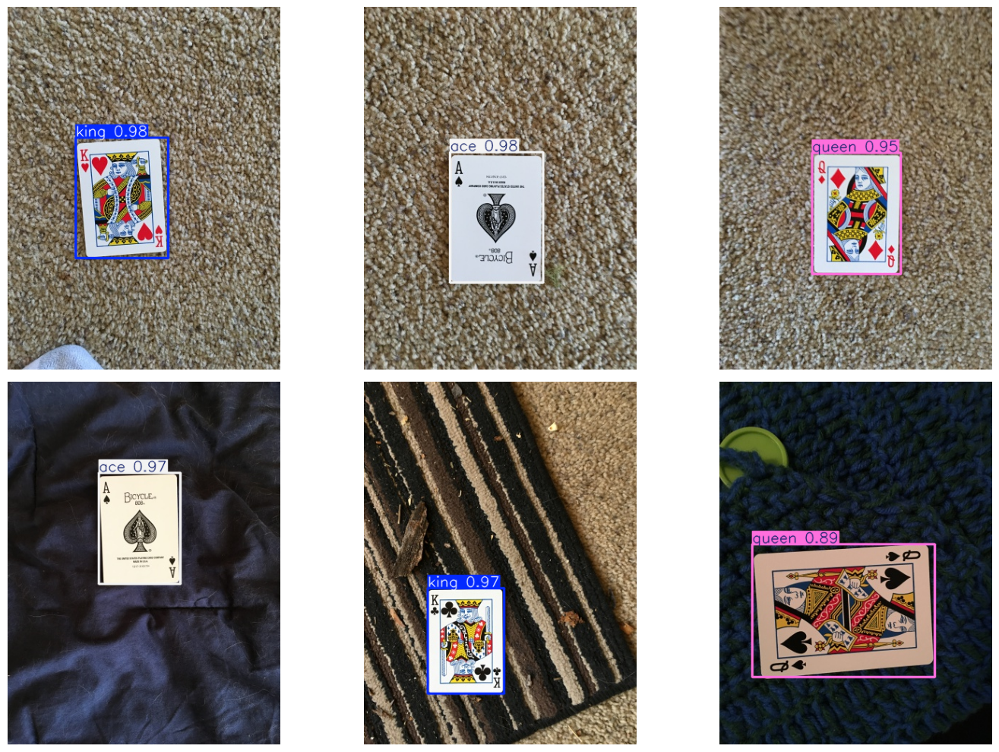

In [41]:
results = model.predict(".\\valid\\images\\", conf=0.25)
plot_results_grid(results[:6])